# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## Writeup / README

### 1. Provide a Writeup / README that includes all the rubric points and how you addressed each one. You can submit your writeup as markdown or pdf.
This notebook is just the writeup.

In [1]:
import numpy as np
import cv2
import glob
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

## Camera Calibration

### 1. Briefly state how you computed the camera matrix and distortion coefficients. Provide an example of a distortion corrected calibration image.

When initializing the CameraCalibration processor, it will:
- prepare the object points in 3d
- read all the images in `camera_cal` folder
- convert them to gray
- find the chessboard corners by `cv2.findChessboardCorners`
- calculate and save the calibrate matrix, dist by `cv2.calibrateCamera`
- when calling the process function, use the calibrate matrix, dist to undistort image by `cv2.undistort`

In [2]:
class PipelineProcessor():
    """ Processor interface who provide the process function. """
    def process(self, img):
        raise NotImplementedError


class CameraCalibration(PipelineProcessor):
    def __init__(self, image_dir, nx, ny):
        objpoints, imgpoints, img_size = self._find_corners(image_dir, nx, ny)
        self.mtx, self.dist = self._calibrate(objpoints, imgpoints, img_size)
        
    def _find_corners(self, image_dir, nx, ny):
        """ Read the images and find the chessboard corners. """
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((nx * ny, 3), np.float32)
        objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
        
        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.

        # Make a list of calibration images
        images = glob.glob(os.path.join(image_dir, '*.jpg'))

        # Step through the list and search for chessboard corners
        for fname in images:
            img = cv2.imread(fname)
            gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

            # If found, add object points, image points
            if ret == True:
                objpoints.append(objp)
                imgpoints.append(corners)
                
        return objpoints, imgpoints, gray.shape[::-1]
    
    def _calibrate(self, objpoints, imgpoints, img_size):
        """ Calculate and save the calibrate matrix and dist. """
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
        return mtx, dist
    
    def process(self, img):
        """Undistort the image.
        
        Returns:
            The undistorted image.
        """
        return cv2.undistort(img, self.mtx, self.dist, None, self.mtx)


calibration = CameraCalibration('camera_cal', 9, 6)

This is the test and example.

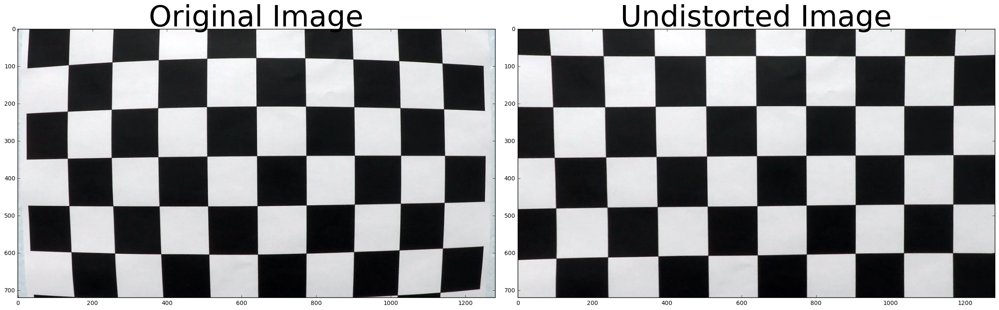

In [3]:
# Test the calibration works well
img = cv2.imread('camera_cal/calibration1.jpg')
undistorted = calibration.process(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.show()

## Pipeline (test images)

### 1. Provide an example of a distortion-corrected image.

Here is the distortion-corrected image.

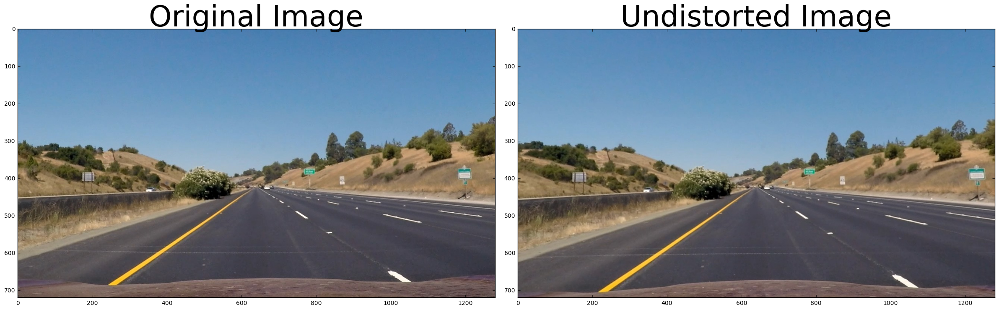

In [4]:
img = mpimg.imread('test_images/straight_lines1.jpg')
undistorted = calibration.process(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.show()

### 2. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image. Provide an example of a binary image result.

Here is the code of my threshold processors. I have added the combined / stacked processor to easily use the set of threshold processors.

In [5]:
class BaseSobelThresh(PipelineProcessor):
    """ The base class of thresh processor. """
    def __init__(self, sobel_kernel, thresh):
        self.sobel_kernel = sobel_kernel
        self.thresh = thresh
        
    def _sobel(self, gray):
        raise NotImplementedError
        
    def process(self, img):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
        sobel = self._sobel(gray)
        
        binary_output = np.zeros_like(sobel)
        binary_output[(self.thresh[0] < sobel) & (sobel <= self.thresh[1])] = 1
        return binary_output


class XSobelThresh(BaseSobelThresh):
    """ Thresh by x sobel. """
    def _sobel(self, gray):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=self.sobel_kernel)
        abs_sobel = np.absolute(sobel)
        scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
        return scaled_sobel

    
class YSobelThresh(BaseSobelThresh):
    """ Thresh by y sobel. """
    def _sobel(self, gray):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=self.sobel_kernel)
        abs_sobel = np.absolute(sobel)
        scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
        return scaled_sobel

    
class MagnitudeSobelThresh(BaseSobelThresh):
    """ Thresh by magnitude sobel. """
    def _sobel(self, gray):
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=self.sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=self.sobel_kernel)
        abs_sobelxy = np.sqrt(np.power(sobelx, 2) + np.power(sobely, 2))
        scaled_sobel = np.uint8(255 * abs_sobelxy / np.max(abs_sobelxy))
        return scaled_sobel

    
class DirectionSobelThresh(BaseSobelThresh):
    """ Thresh by direction sobel. """
    def _sobel(self, gray):
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=self.sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=self.sobel_kernel)
        abs_sobelx = np.absolute(sobelx)
        abs_sobely = np.absolute(sobely) 
        direction_sobel = np.arctan2(abs_sobely, abs_sobelx)
        return direction_sobel


class CombinedProcessor(PipelineProcessor):
    """ Return the both white pixels of all processors. """
    def __init__(self, *processors):
        self.processors = processors
        
    def process(self, img):
        combined = np.ones_like(img[:,:,0])
        for processor in self.processors:
            binary = processor.process(img)
            combined = combined * binary
        return combined


class StackedProcessor(PipelineProcessor):
    """ Return the stack image of all processors. """
    def __init__(self, *processors):
        self.processors = processors
        
    def process(self, img):
        stacked = np.zeros_like(img[:,:,0])
        for processor in self.processors:
            binary = processor.process(img)
            stacked[binary == 1] = 1
        return stacked

Here is the threshold test playground. And I keep the last two statement.

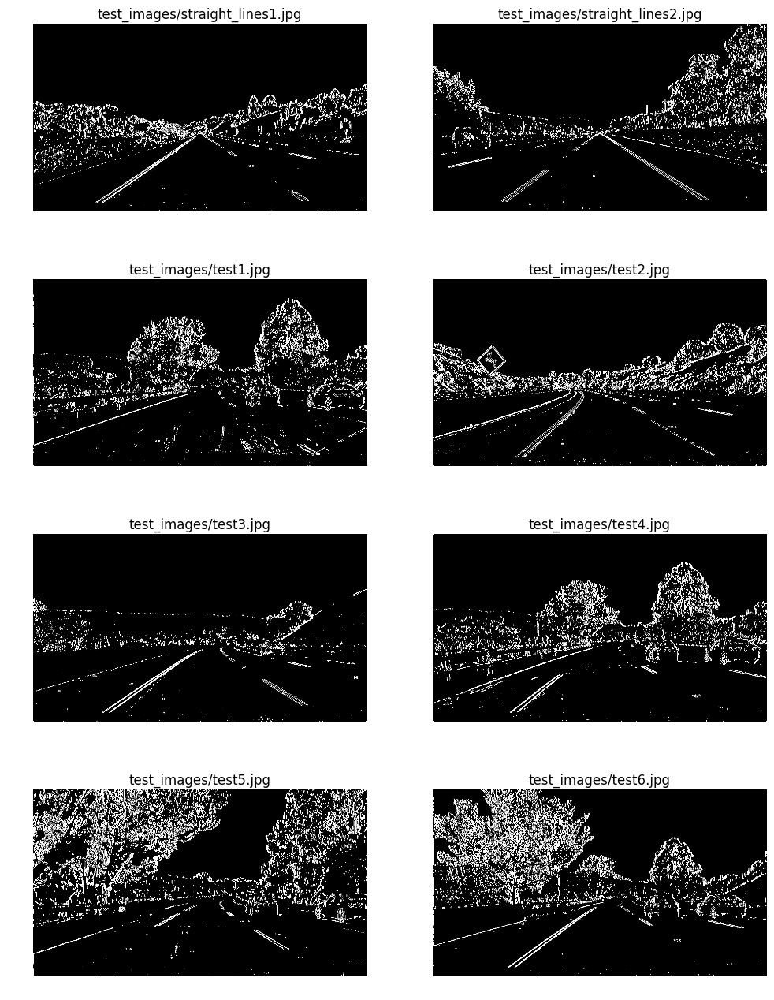

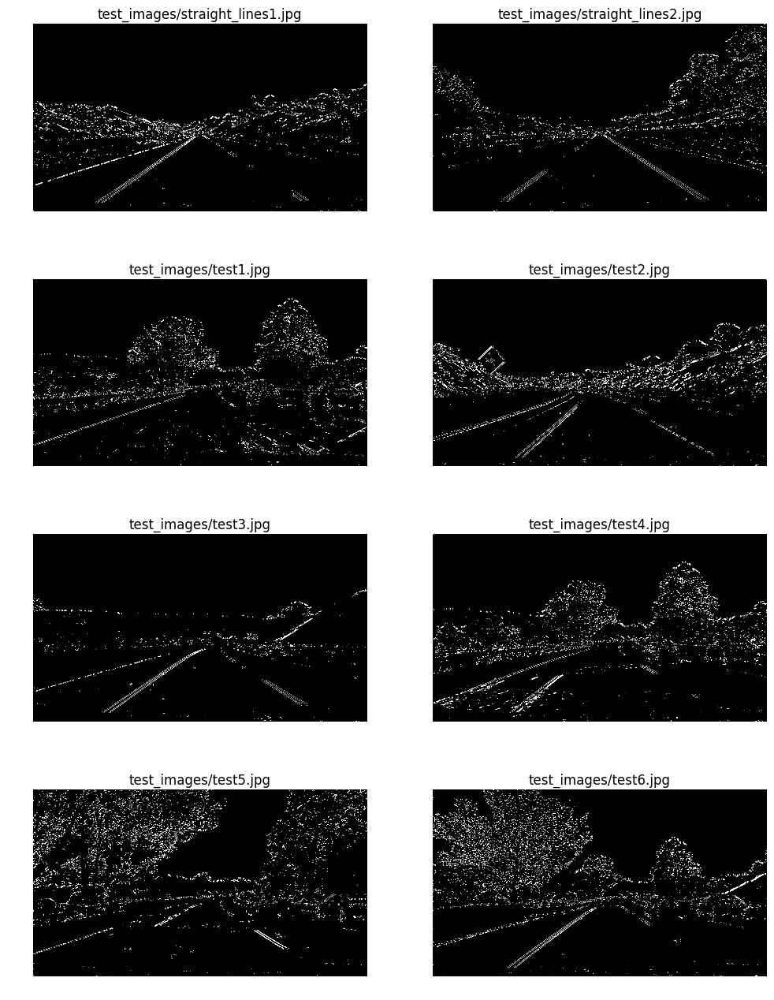

In [6]:
def test_thresh(thresh_class, thresh_start, thresh_step, thresh_mean, ksize=3, fname='test_images/straight_lines1.jpg', rows=3):
    print('%s with ksize=%d' % (thresh_class.__name__, ksize))
    img = mpimg.imread(fname)
    nrows = 3
    plt.figure(figsize=(12, 2 * rows))
    for i in range(nrows * rows):
        thresh_min = thresh_start + i * thresh_step
        thresh_max = 2 * thresh_mean - thresh_min
        sobel_thresh = thresh_class(ksize, (thresh_min, thresh_max))
        binary = sobel_thresh.process(img)
        plt.subplot(rows, nrows, i + 1)
        plt.axis('off')
        plt.title('%.2f - %.2f' % (thresh_min, thresh_max))
        plt.imshow(binary, 'gray')

    plt.show()
    

def test_thresh_for_all(processor):
    images = glob.glob(os.path.join('test_images/*.jpg'))
    nrows = 2
    rows = np.ceil(len(images) / nrows)
    plt.figure(figsize=(12, 4 * rows))
    for i, fname in enumerate(sorted(images)):
        img = mpimg.imread(fname)
        binary = processor.process(img)
        plt.subplot(rows, nrows, i + 1)
        plt.axis('off')
        plt.title(fname)
        plt.imshow(binary, 'gray')

        
# ksize=9 and 15 works well
# test_thresh(XSobelThresh, 20, 10, 100, 5, rows=1)
# test_thresh(XSobelThresh, 20, 10, 100, 9, rows=1)
# test_thresh(XSobelThresh, 20, 10, 100, 15, rows=1)
# test_thresh(XSobelThresh, 20, 10, 100, 25, rows=1)

# thresh_min in [20, 30] works well
# test_thresh(XSobelThresh, 15, 2.5, 100, 9, 'test_images/straight_lines1.jpg')
# test_thresh(XSobelThresh, 15, 2.5, 100, 9, 'test_images/test5.jpg')

# Make sure thresh_min in [20, 30] and ksize=9 works well for all test images
# test_thresh_for_all(XSobelThresh(9, (20, 100)))
# test_thresh_for_all(YSobelThresh(9, (20, 100)))
# test_thresh_for_all(CombinedThresh(XSobelThresh(9, (20, 100)), YSobelThresh(9, (20, 100))))

# ksize=9 and 15 works well
# test_thresh(MagnitudeSobelThresh, 30, 10, 100, 5, rows=1)
# test_thresh(MagnitudeSobelThresh, 30, 10, 100, 9, rows=1)
# test_thresh(MagnitudeSobelThresh, 30, 10, 100, 15, rows=1)
# test_thresh(MagnitudeSobelThresh, 30, 10, 100, 25, rows=1)

# treash_min=35 works well
# test_thresh(MagnitudeSobelThresh, 20, 5, 100, 9, 'test_images/straight_lines1.jpg')
# test_thresh(MagnitudeSobelThresh, 20, 5, 100, 9, 'test_images/test5.jpg')

# ksize=15 and 25 works well
# test_thresh(DirectionSobelThresh, 0.7, 0.1, 1, 5, rows=1)
# test_thresh(DirectionSobelThresh, 0.7, 0.1, 1, 9, rows=1)
# test_thresh(DirectionSobelThresh, 0.7, 0.1, 1, 15, rows=1)
# test_thresh(DirectionSobelThresh, 0.7, 0.1, 1, 25, rows=1)

# thresh_min in [0.7, 0.9] works well
# test_thresh(DirectionSobelThresh, 0.6, 0.05, 1, 9)

# test_thresh(MagnitudeSobelThresh, 30, 5, 100, 9, rows=1)
# test_thresh(DirectionSobelThresh, 0.7, 0.1, 1, 15, rows=1)

test_thresh_for_all(CombinedProcessor(XSobelThresh(9, (20, 100)), YSobelThresh(9, (20, 100))))
test_thresh_for_all(CombinedProcessor(MagnitudeSobelThresh(9, (30, 100)), DirectionSobelThresh(15, (0.7, 1.3))))

Also I have try to visulize all the channels to find the best one.

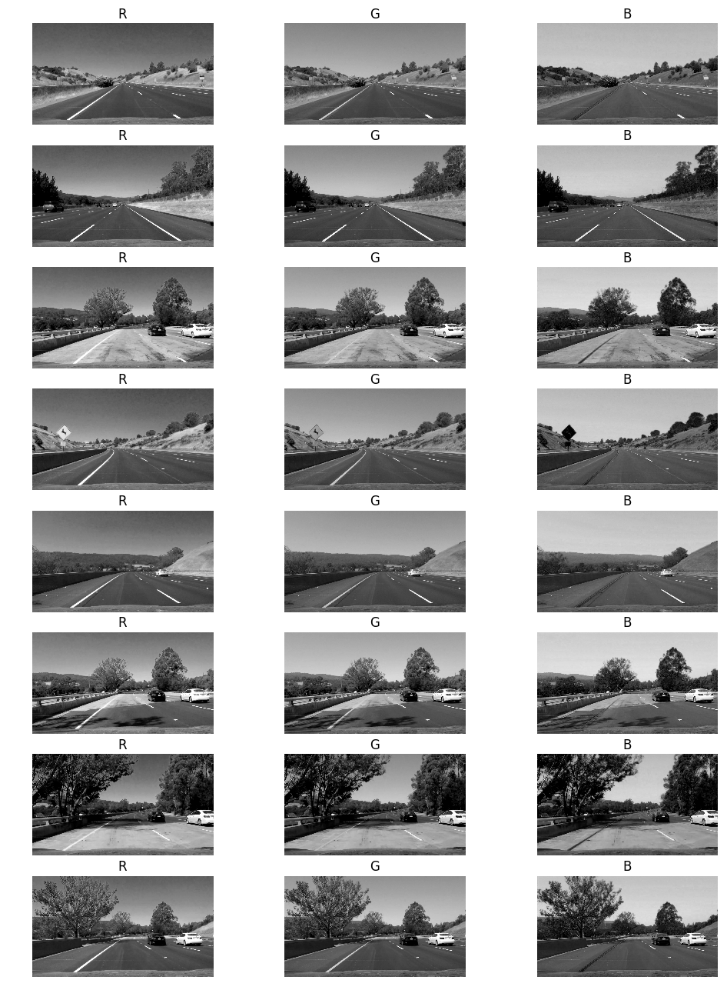

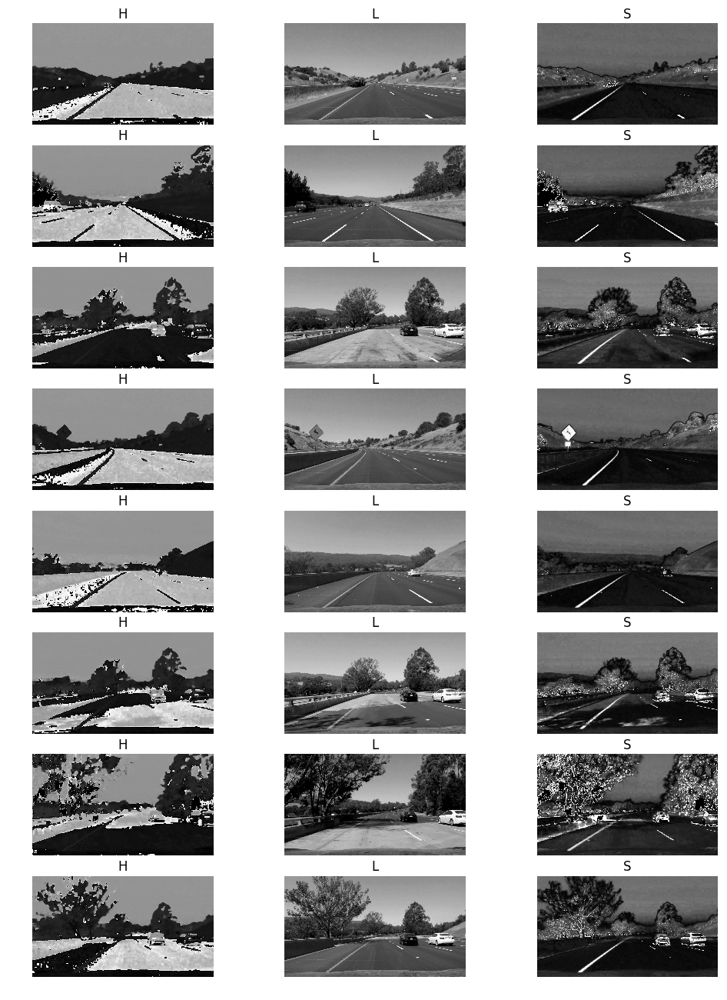

In [7]:
def test_channels(channels, process):
    images = glob.glob(os.path.join('test_images/*.jpg'))
    rows = len(images)
    plt.figure(figsize=(12, 2 * rows))
    for i, fname in enumerate(sorted(images)):
        img = mpimg.imread(fname)
        img = process(img)
        plt.subplot(rows, 3, 3 * i + 1)
        plt.axis('off')
        plt.title(channels[0])
        plt.imshow(img[:,:,0], 'gray')
        plt.subplot(rows, 3, 3 * i + 2)
        plt.axis('off')
        plt.title(channels[1])
        plt.imshow(img[:,:,1], 'gray')
        plt.subplot(rows, 3, 3 * i + 3)
        plt.axis('off')
        plt.title(channels[2])
        plt.imshow(img[:,:,2], 'gray')


test_channels(['R', 'G', 'B'], lambda img: img)
test_channels(['H', 'L', 'S'], lambda img: cv2.cvtColor(img, cv2.COLOR_RGB2HLS))

Like the result in lesson, the S channel is greater than others, so I have implemented the S channel thresh. 

In [8]:
class SChaneelThresh(PipelineProcessor):
    def __init__(self, thresh):
        self.thresh = thresh

    def process(self, img):
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        s_channel = hls[:, :, 2]
        binary = np.zeros_like(s_channel)
        binary[(self.thresh[0] < s_channel) & (s_channel <= self.thresh[1])] = 1
        return binary

Now test the stacked color image and final output.

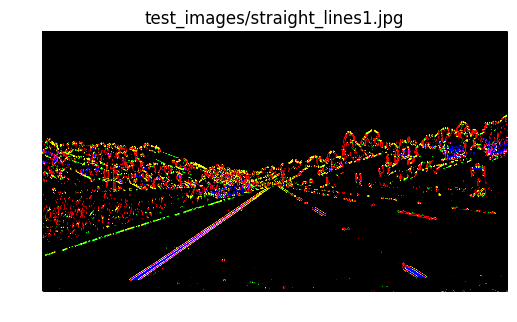

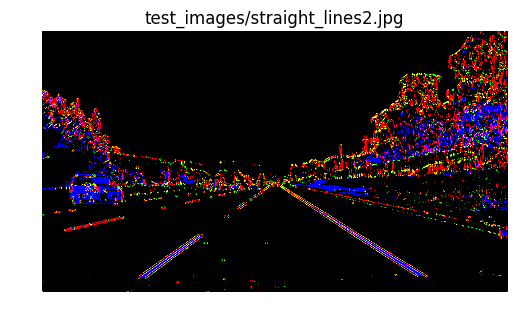

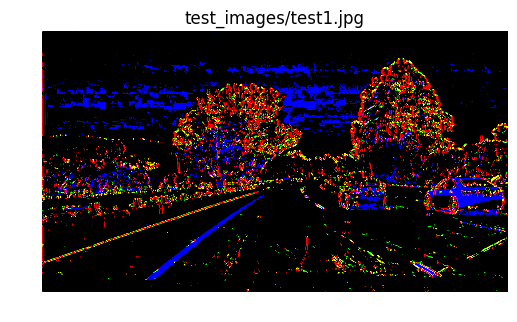

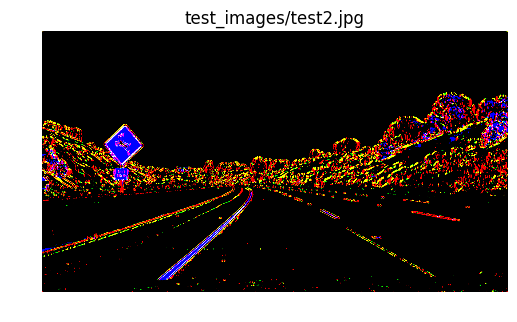

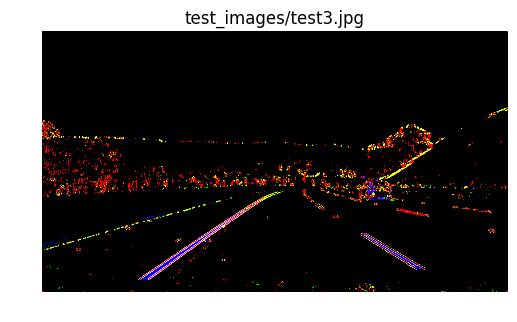

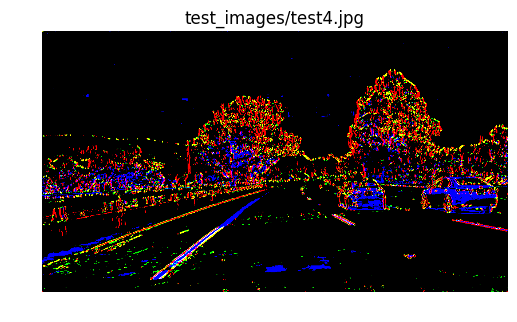

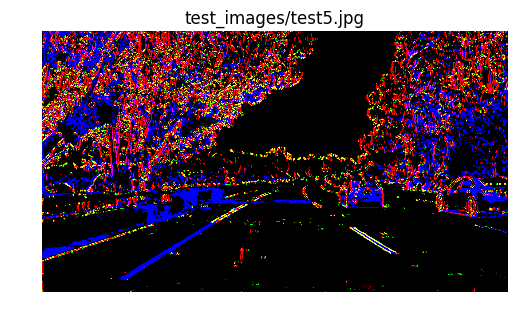

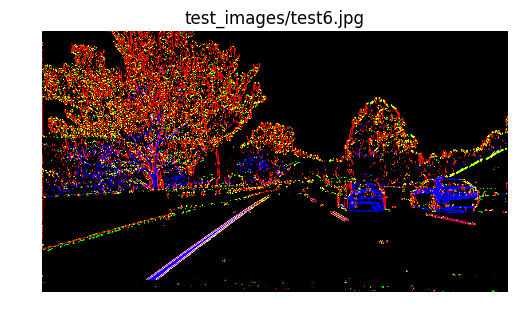

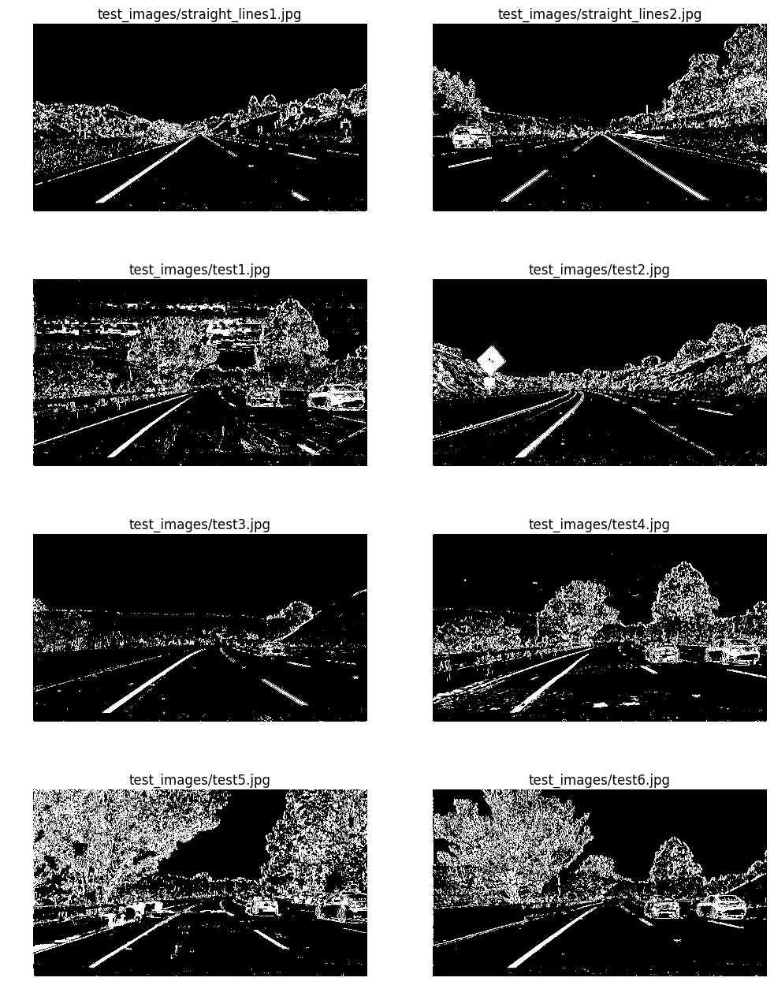

In [9]:
def test_stacked_thresh(*processors):
    assert (len(processors) == 3)
    images = glob.glob(os.path.join('test_images/*.jpg'))
    for i, fname in enumerate(sorted(images)):
        img = mpimg.imread(fname)
        color_binary = np.dstack([processor.process(img) for processor in processors])
        plt.title(fname)
        plt.axis('off')
        plt.imshow(color_binary)
        plt.show()

test_stacked_thresh(
    CombinedProcessor(XSobelThresh(9, (20, 100)), YSobelThresh(9, (20, 100))),
    CombinedProcessor(MagnitudeSobelThresh(9, (30, 100)), DirectionSobelThresh(15, (0.7, 1.3))),
    SChaneelThresh((130, 255))
)

test_thresh_for_all(
    StackedProcessor(
        CombinedProcessor(XSobelThresh(9, (20, 100)), YSobelThresh(9, (20, 100))),
        CombinedProcessor(MagnitudeSobelThresh(9, (30, 100)), DirectionSobelThresh(15, (0.7, 1.3))),
        SChaneelThresh((130, 255))
    )
)

### 3. Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

First I have try to find some information about the lane line length, so I have used the google maps.

![Google Maps](writeup_images/google_map.png)

And then I have calculate the lane line length:
- 100px = 5m
- lane line length = 79px = 4m
- lane line margin = 194px = 10m
- lane width = 70px = 3.5m

And then, I have repeated adjustment the perspective src and dst to make the lanes be straight.

In [10]:
perspective_width = 500
perspective_height = 1250

perspective_src = np.float32(
    [[0, 720],
     [571, 451],
     [709, 451],
     [1280, 720]])

perspective_dst = np.float32(
    [[0, perspective_height],
     [0, 0],
     [perspective_width, 0],
     [perspective_width, perspective_height]])


class PerspectiveTransform(PipelineProcessor):
    def __init__(self):
        self.M = cv2.getPerspectiveTransform(perspective_src, perspective_dst)

    def process(self, img):
        warped = cv2.warpPerspective(img, self.M, (perspective_width, perspective_height), flags=cv2.INTER_LINEAR)
        return warped


class InversePerspectiveTransform(PipelineProcessor):
    def __init__(self):
        self.M = cv2.getPerspectiveTransform(perspective_dst, perspective_src)
        self.warped_shape = (perspective_width, perspective_height)

    def process(self, img):
        warped = cv2.warpPerspective(img, self.M, (1280, 720), flags=cv2.INTER_LINEAR)
        return warped


perspective_transform = PerspectiveTransform()
inverse_perspective_transform = InversePerspectiveTransform()

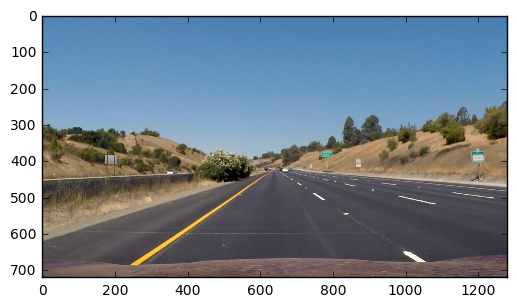

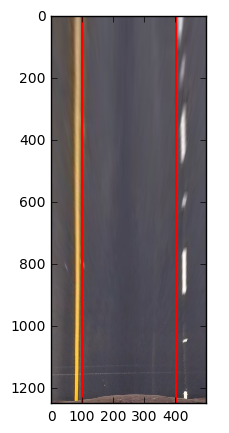

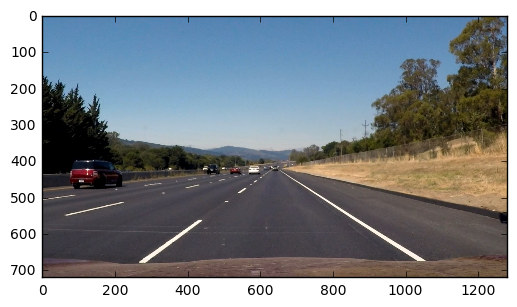

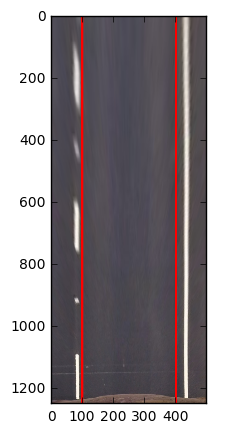

In [11]:
def test_perspective_transform(fname):
    img = mpimg.imread(fname)
    plt.imshow(img)
    plt.show()

    plt.figure(figsize=(2, 8))
    undistorted = calibration.process(img)
    warped = perspective_transform.process(undistorted)
    cv2.line(warped, (100, 0), (100, 1500), (255, 0, 0), 5)
    cv2.line(warped, (400, 0), (400, 1500), (255, 0, 0), 5)
    plt.imshow(warped)
    plt.show()


# Tunes the perspective matrix
test_perspective_transform('test_images/straight_lines1.jpg')
test_perspective_transform('test_images/straight_lines2.jpg')

### 4. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

I have copy the code from lession and modify the part of l_center, r_center.  
Now I calculate the l_sum and r_sum only the half bottom of the image because some noise appears in the top of image.  
And also I have let the l_center and r_center can be pass by parameters, when we find the two lanes in the last iteration of video frame.

In [12]:
class CentroidProcessor(PipelineProcessor):
    def __init__(self, window_width, window_height, margin):
        self.window_width = window_width
        self.window_height = window_height
        self.margin = margin
        
    def process(self, img, l_center=None, r_center=None):
        return self._find_window_centroids(img, l_center, r_center, self.window_width, self.window_height, self.margin)
        
    def _find_window_centroids(self, warped, l_center, r_center, window_width, window_height, margin):
        window_centroids = []  # Store the (left,right) window centroid positions per level
        window = np.ones(window_width)  # Create our window template that we will use for convolutions

        # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
        # and then np.convolve the vertical image slice with the window template 

        # Sum half bottom of image to get slice, could use a different ratio
        if l_center is None:
            l_sum = np.sum(warped[int(warped.shape[0] / 2):, :int(warped.shape[1] / 2)], axis=0)
            l_center = np.argmax(np.convolve(window, l_sum)) - window_width / 2
        if r_center is None:
            r_sum = np.sum(warped[int(warped.shape[0] / 2):, int(warped.shape[1] / 2):], axis=0)
            r_center = np.argmax(np.convolve(window, r_sum)) - window_width / 2 + int(warped.shape[1] / 2)

        # Add what we found for the first layer
        window_centroids.append((l_center, r_center))

        # Go through each layer looking for max pixel locations
        for level in range(1, (int)(warped.shape[0] / window_height)):
            # convolve the window into the vertical slice of the image
            image_layer = np.sum(
                warped[int(warped.shape[0] - (level + 1) * window_height):int(warped.shape[0] - level * window_height), :],
                axis=0)
            conv_signal = np.convolve(window, image_layer)
            # Find the best left centroid by using past left center as a reference
            # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
            offset = window_width / 2
            l_min_index = int(max(l_center + offset - margin, 0))
            l_max_index = int(min(l_center + offset + margin, warped.shape[1]))
            l_center = np.argmax(conv_signal[l_min_index:l_max_index]) + l_min_index - offset
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center + offset - margin, 0))
            r_max_index = int(min(r_center + offset + margin, warped.shape[1]))
            r_center = np.argmax(conv_signal[r_min_index:r_max_index]) + r_min_index - offset
            # Add what we found for that layer
            window_centroids.append((l_center, r_center))

        return window_centroids

    
centroid_processor = CentroidProcessor(25, 150, 25)

Now test the code.

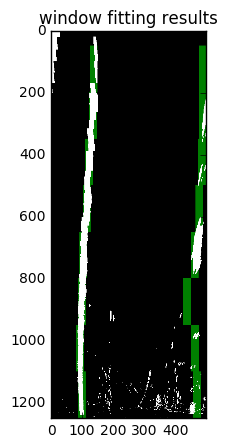

In [13]:
pipelines = [
    calibration,
    StackedProcessor(
        CombinedProcessor(XSobelThresh(9, (20, 100)), YSobelThresh(9, (20, 100))),
        CombinedProcessor(MagnitudeSobelThresh(9, (30, 100)), DirectionSobelThresh(15, (0.7, 1.3))),
        SChaneelThresh((130, 255))
    ),
    perspective_transform,
]

img = mpimg.imread('test_images/test1.jpg')
warped = np.copy(img)
for pipeline in pipelines:
    warped = pipeline.process(warped)


def window_mask(width, height, img_ref, center, level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0] - (level + 1) * height):int(img_ref.shape[0] - level * height),
    max(0, int(center - width / 2)):min(int(center + width / 2), img_ref.shape[1])] = 1
    return output

window_centroids = centroid_processor.process(warped)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)

    # Go through each level and draw the windows 
    for level in range(0, len(window_centroids)):
        # Window_mask is a function to draw window areas
        l_mask = window_mask(centroid_processor.window_width, centroid_processor.window_height, warped, window_centroids[level][0], level)
        r_mask = window_mask(centroid_processor.window_width, centroid_processor.window_height, warped, window_centroids[level][1], level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1))] = 255
        r_points[(r_points == 255) | ((r_mask == 1))] = 255

    # Draw the results
    template = np.array(r_points + l_points, np.uint8)  # add both left and right window pixels together
    zero_channel = np.zeros_like(template)  # create a zero color channle
    template = np.array(cv2.merge((zero_channel, template, zero_channel)), np.uint8)  # make window pixels green
    warpage = np.array(cv2.merge((warped, warped, warped)) * 255,
                       np.uint8)  # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0)  # overlay the orignal road image with window results

# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped, warped, warped)), np.uint8)

# Display the final results
plt.figure(figsize=(2, 8))
plt.imshow(output)
plt.title('window fitting results')
plt.show()

### 5. Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

Using the `np.polyfit` function to fit the finded lane blocks.  
And then, using the length calculated in google maps to fix the pixels to meters.

In [14]:
class PolyfitProcessor(PipelineProcessor):
    def __init__(self, xm_per_pix, ym_per_pix):
        # Define conversions in x and y from pixels space to meters
        self.xm_per_pix = xm_per_pix  # meters per pixel in x dimension
        self.ym_per_pix = ym_per_pix  # meters per pixel in y dimension
        
    def process(self, window_centroids):
        ploty = np.arange(1250, 1250 - len(window_centroids) * centroid_processor.window_height,  -centroid_processor.window_height, np.float32)
        y_eval = np.max(ploty)
        leftx = np.array([left for left, right in window_centroids])
        rightx = np.array([right for left, right in window_centroids])

        left_fit = np.polyfit(ploty, leftx, 2)
        left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
        right_fit = np.polyfit(ploty, rightx, 2)
        right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
        
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(ploty * self.ym_per_pix, leftx * self.xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty * self.ym_per_pix, rightx * self.xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * self.ym_per_pix + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
            2 * left_fit_cr[0])
        right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * self.ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
            2 * right_fit_cr[0])

        vehicle_position = (250 - (leftx[0] + rightx[0]) / 2) * self.xm_per_pix
        
        return leftx, rightx, left_fitx, right_fitx, ploty, left_curverad, right_curverad, vehicle_position


polyfit =  PolyfitProcessor(3.5 / 350, 4 / 150)

Test the curve fix result.

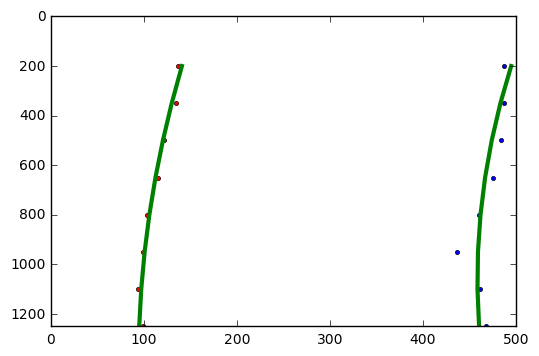

1092.70397271 722.634581931 -0.33


In [15]:
leftx, rightx, left_fitx, right_fitx, ploty, left_curverad, right_curverad, vehicle_position = polyfit.process(window_centroids)

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 500)
plt.ylim(0, 1250)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images
plt.show()

print(left_curverad, right_curverad, vehicle_position)

### 6. Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

Using the inverse perspective matrix to draw the polygon by two lanes back to image.

In [16]:
class WarpLaneBack(PipelineProcessor):
    def __init__(self, perspective):
        self.perspective = perspective
        
    def process(self, img, left_fitx, right_fitx, ploty):
        # Create an image to draw the lines on
        warp_zero = np.zeros(self.perspective.warped_shape[::-1]).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = inverse_perspective_transform.process(color_warp)
        # Combine the result with the original image
        result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
        
        return result


warp_lane_back = WarpLaneBack(inverse_perspective_transform)

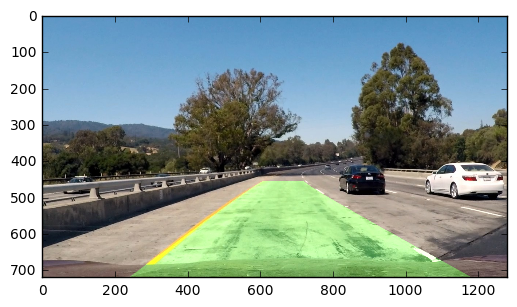

In [17]:
result = warp_lane_back.process(img, left_fitx, right_fitx, ploty)
plt.imshow(result)
plt.show()

And also draw the text of curvature and vehicle_position.

In [18]:
class HUDDisplay(PipelineProcessor):
    def __init__(self):
        self.font = cv2.FONT_HERSHEY_SIMPLEX
        
    def process(self, img, left_curverad, right_curverad, vehicle_position):
        img_zero = np.zeros_like(img).astype(np.uint8)
        
        curvature = (left_curverad + right_curverad) / 2
        
        cv2.putText(img_zero, 'Curvature: %dm' % curvature, (50, 600), self.font, 1, (200, 111, 66), 2)
        if vehicle_position != 0:
            text = '%.2fm %s of center' % (abs(vehicle_position), 'left' if vehicle_position < 0 else 'right')
            cv2.putText(img_zero, text, (50, 650), self.font, 1, (200, 111, 66), 2)
        
        # Combine the result with the original image
        result = cv2.addWeighted(img, 1, img_zero, 0.9, 0)
        
        return result


hud_display = HUDDisplay()

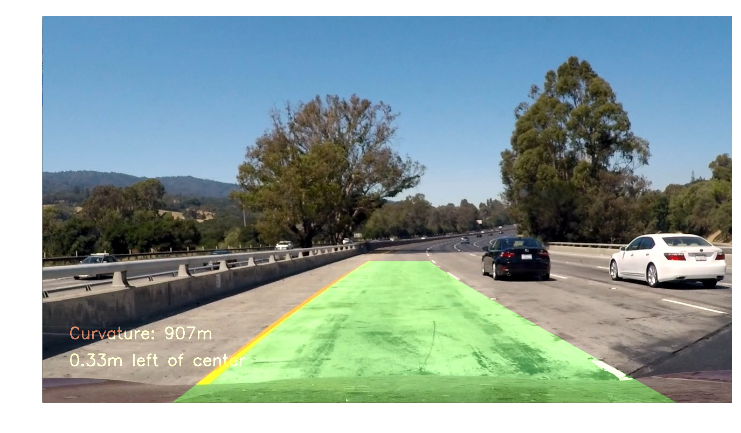

In [19]:
hud_result = hud_display.process(result, left_curverad, right_curverad, vehicle_position)
plt.figure(figsize=(10, 5))
plt.axis('off')
plt.imshow(hud_result)
plt.show()

## Pipeline (video)

### 1. Provide a link to your final video output. Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!)

The pipeline is almost same as the image pipeline.

I have implemented a very simple line class, to save the two lines of the last frame. And just use the average to make the lane line smoothly.  
I have used last two lane line's x position to calculate window_centroids hasn't a good result, so I remove this features, just calculate the l_center and r_center for every frame.  

In [20]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        self.detected = False
        self.recent_xfitted = None
        self.recent_curvature = None
        self.bestx = None
        self.best_curvature = None
        
    def update(self, x, y, fitx, curverad, vehicle_position):
        x = np.average(x)
        
        if self.detected:
            self.bestx = (self.recent_xfitted + x) / 2
            self.best_curvature = (self.recent_curvature + curverad) / 2
        else:
            self.bestx = x
            self.best_curvature = curverad
        
        self.recent_xfitted = x
        self.recent_curvature = curverad


class LaneFinder(PipelineProcessor):
    def __init__(self):
        self.init_lines()
        
        self.pipeline = [
            calibration,
            StackedProcessor(
                CombinedProcessor(XSobelThresh(9, (20, 100)), YSobelThresh(9, (20, 100))),
                CombinedProcessor(MagnitudeSobelThresh(9, (30, 100)), DirectionSobelThresh(15, (0.7, 1.3))),
                SChaneelThresh((130, 255))
            ),
            perspective_transform,
        ]
        self.centroid_processor = centroid_processor
        self.polyfit = polyfit
        self.warp_lane_back = warp_lane_back
        self.hud_display = hud_display
        
    def init_lines(self):
        """ Init the line instance for not continued frames. """
        self.left_line = Line()
        self.right_line = Line()

    def process(self, img):
        result = np.copy(img)
        for processor in self.pipeline:
            result = processor.process(result)
        
        # Calculate the window centroids
        window_centroids = self.centroid_processor.process(result, None, None)
        
        leftx, rightx, left_fitx, right_fitx, ploty, left_curverad, right_curverad, vehicle_position = self.polyfit.process(window_centroids)
        # Update two lane line status
        self.left_line.update(leftx, ploty, left_fitx, left_curverad, vehicle_position)
        self.right_line.update(rightx, ploty, right_fitx, right_curverad, vehicle_position)
        result = self.warp_lane_back.process(img, left_fitx, right_fitx, ploty)
        result = self.hud_display.process(result, self.left_line.best_curvature, self.right_line.best_curvature, vehicle_position)
        return result
    
lane_finder = LaneFinder()

Test the images, remenber to clear recent lane line for non continued frames.

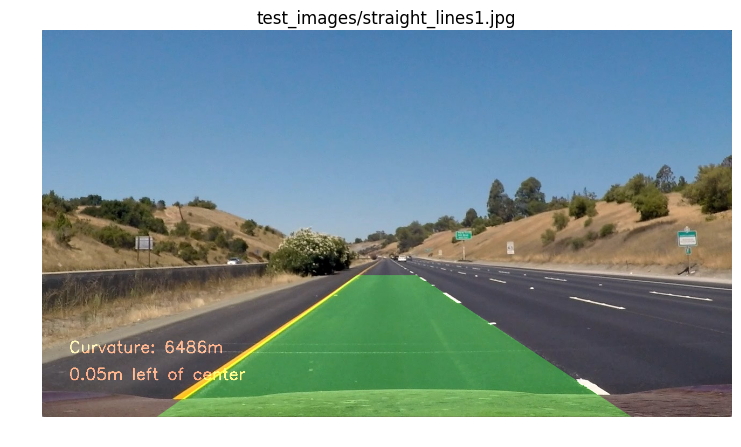

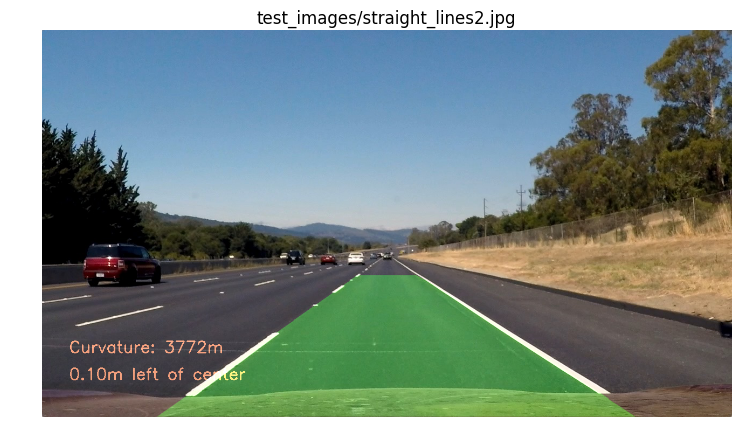

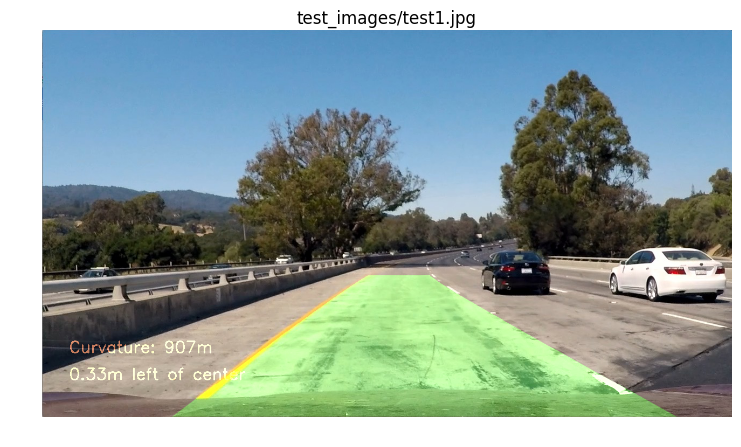

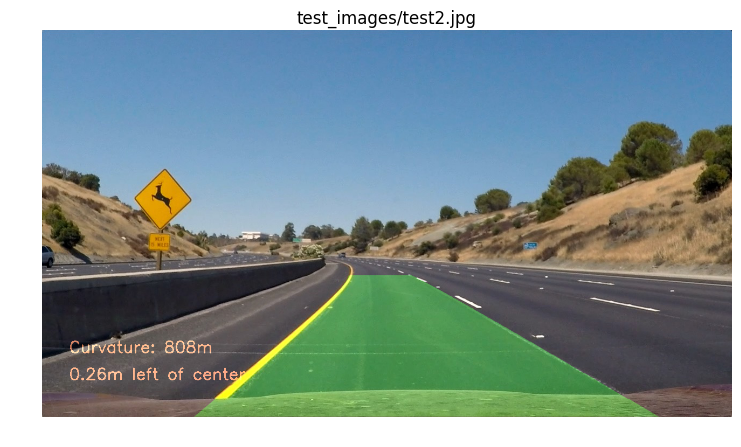

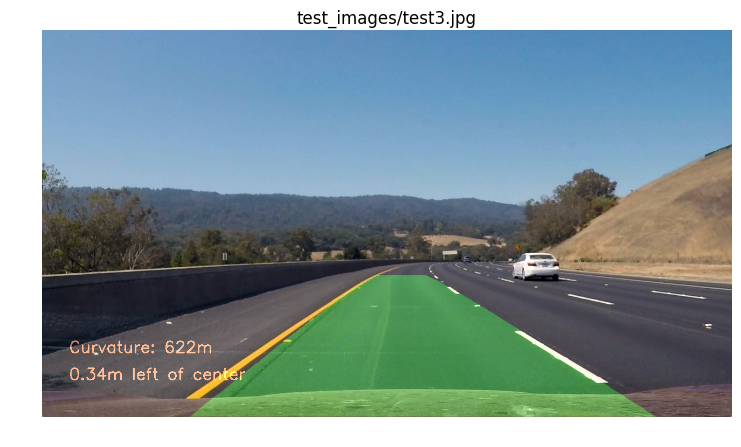

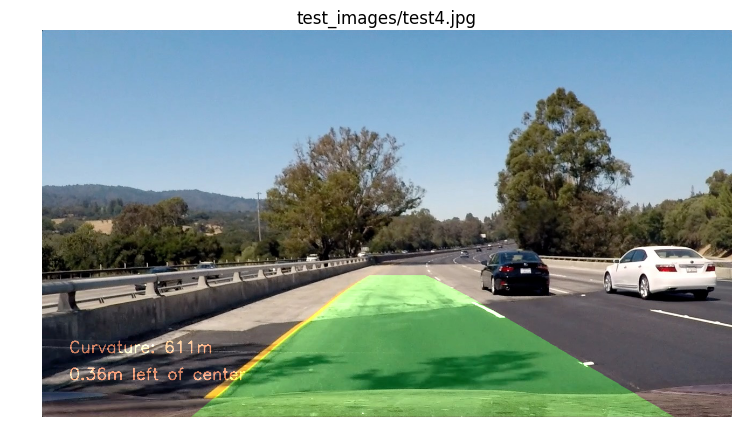

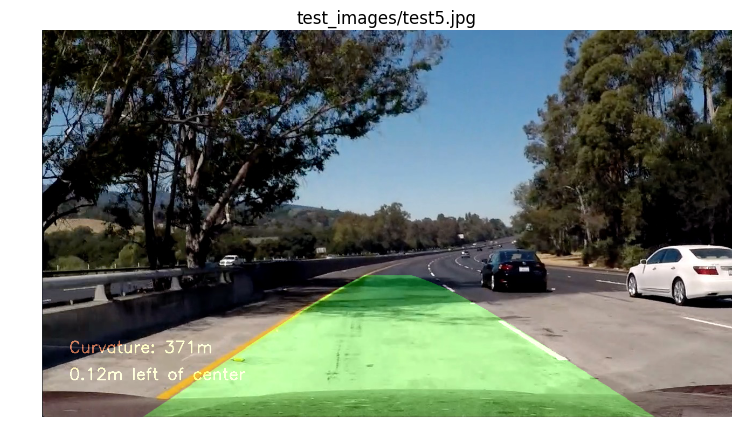

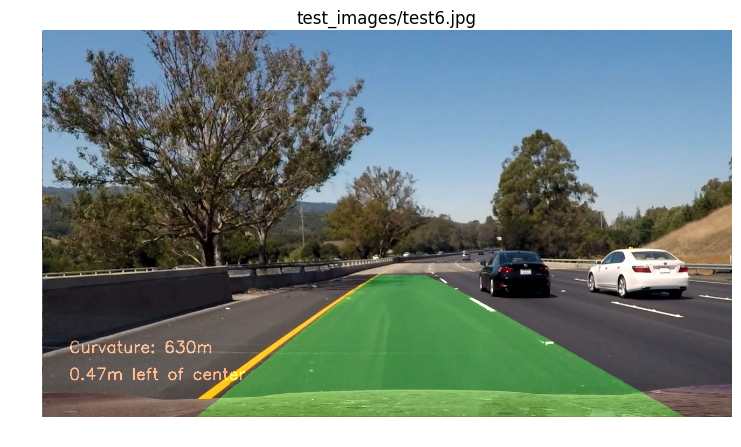

In [21]:
images = glob.glob(os.path.join('test_images/*.jpg'))
for i, fname in enumerate(sorted(images)):
    img = mpimg.imread(fname)
    result = lane_finder.process(img)
    lane_finder.init_lines()
    
    plt.figure(figsize=(10, 5))
    plt.axis('off')
    plt.title(fname)
    plt.imshow(result)
    plt.show()
    
    mpimg.imsave(fname.replace('test_images', 'output_images'), result)

In [22]:
# Transform the video
video_output = 'project_video_output.mp4'
clip = VideoFileClip('project_video.mp4').fl_image(lane_finder.process)
%time clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [07:35<00:00,  2.69it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 13min 24s, sys: 9.35 s, total: 13min 33s
Wall time: 7min 37s


If you can't watch this video, just try the [`project_video_output.mp4`](https://github.com/romain-li/CarND-Advanced-Lane-Lines/blob/master/project_video_output.mp4) file link in the repositry.

In [23]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

## Discussion

### 1. Briefly discuss any problems / issues you faced in your implementation of this project. Where will your pipeline likely fail? What could you do to make it more robust?

#### Issues

- The S channel makes some shadow be very light in the binary image. Maybe it will disturb the lane line finding function.
  ![s_channel](./writeup_images/s_channel.png)
- The window centroid algorithm is really hard to understand.
- The guardrail on both side of the road will be the noise of lane line pixels. Fortunately, the window centroid algorithm can ignore them correctly.
- I have tried some complex strategy for the recent lane line, to make the lane line smoothly and robustly for every frame. But always I can't get a better result, so finnaly I have used the average function, not bad.
- The curvature is not good, sometimes like 300m, it's not reasonable.
- The fitted lane are not 100% accuracy.

#### Where will your pipeline likely fail?

- **If some shadow or else in middle of the road, the thresh function will return a very noisy image, and then we can't find the lane lines correctly.**  
  I think we can mutiple a weighted matrix for the image, let the pixels near the lane line pixels of the last frame have high weight, maybe the window centroid function can find the lane line correctly.
- **If the road is not flat, perspective transform will be failed.**  
  I think we can only use some hardware like infrared to detect the road, and use this information to calculate the perspective transformer.
- **If some car is behind our camera, the pipeline can't work very well.**  
  Use some car detect strategy like Deep learning to find the cars, and ignore the pixels near the car, then we can get one image with some hole to find the lane lines.
- **If the weather is not good, like snowing, the image will be very noisy. **  
  Maybe the canny edge detection can solve this scene.